In [129]:
#1: Importações

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

csv_path = "campoes_brasileiro.csv"

# leitura dos dados
df = pd.read_csv(csv_path, encoding='utf-8')

# mostrar as 8 primeiras linhas e info básica
display(df.head(5))

,Ano,Vencedor,Vice,Terceiro colocado,Quarto colocado,Artilheiro(s),Gols
0,1959,Bahia,Santos,Grêmio,Vasco da Gama,Léo Briglia (Bahia),8
1,1960,Palmeiras,Fortaleza,Fluminense,Santa Cruz,Bececê (Fortaleza),7
2,1961,Santos,Bahia,America,Náutico,Pelé (Santos),7
3,1962,Santos,Botafogo,Internacional,Sport,Coutinho (Santos),7
4,1963,Santos,Bahia,Grêmio,Botafogo,Pelé (Santos),8


In [130]:
df = df[['Ano', 'Vencedor']].copy() # Utilizando apenas colunas relevantes
display(df.head(5))

,Ano,Vencedor
0,1959,Bahia
1,1960,Palmeiras
2,1961,Santos
3,1962,Santos
4,1963,Santos


In [131]:
# Definindo cidade-sede de cada clube do Data Frame

cidades = {
    'Bahia': 'Salvador',
    'Sport': 'Recife',
    'Palmeiras': 'São Paulo',
    'Santos': 'Santos',
    'Cruzeiro': 'Belo Horizonte',
    'Flamengo': 'Rio de Janeiro',
    'Fluminense': 'Rio de Janeiro',
    'Grêmio': 'Porto Alegre',
    'Internacional': 'Porto Alegre',
    'Corinthians': 'São Paulo',
    'Atlético': 'Belo Horizonte',
    'Vasco': 'Rio de Janeiro',
    'Botafogo': 'Rio de Janeiro',
    'Coritiba': 'Curitiba',
    'Guarani': 'Campinas',
}


In [132]:
# Criando coluna Cidade
df['Cidade'] = df['Vencedor'].map(cidades)

# Conferindo resultado
print(df.to_string(index=False)) # Retirando o Índice


 Ano      Vencedor         Cidade
1959         Bahia       Salvador
1960     Palmeiras      São Paulo
1961        Santos         Santos
1962        Santos         Santos
1963        Santos         Santos
1964        Santos         Santos
1965        Santos         Santos
1966      Cruzeiro Belo Horizonte
1967     Palmeiras      São Paulo
1967     Palmeiras      São Paulo
1968        Santos         Santos
1968      Botafogo Rio de Janeiro
1969     Palmeiras      São Paulo
1970    Fluminense Rio de Janeiro
1971      Atlético Belo Horizonte
1972     Palmeiras      São Paulo
1973     Palmeiras      São Paulo
1974         Vasco Rio de Janeiro
1975 Internacional   Porto Alegre
1976 Internacional   Porto Alegre
1977           São            NaN
1978       Guarani       Campinas
1979 Internacional   Porto Alegre
1980      Flamengo Rio de Janeiro
1981        Grêmio   Porto Alegre
1982      Flamengo Rio de Janeiro
1983      Flamengo Rio de Janeiro
1984    Fluminense Rio de Janeiro
1985      Cori

In [137]:
# Calculando o número de títulos de cada cidade e criando nova coluna para Títulos 

titulos_por_cidade = df['Cidade'].value_counts().reset_index()
titulos_por_cidade.columns = ['Cidade', 'Títulos']
display(titulos_por_cidade.style.hide(axis='index')) #Retirando índice

Cidade,Títulos
São Paulo,17
Rio de Janeiro,16
Santos,8
Belo Horizonte,6
Porto Alegre,5
Salvador,2
Campinas,1
Curitiba,1
Recife,1


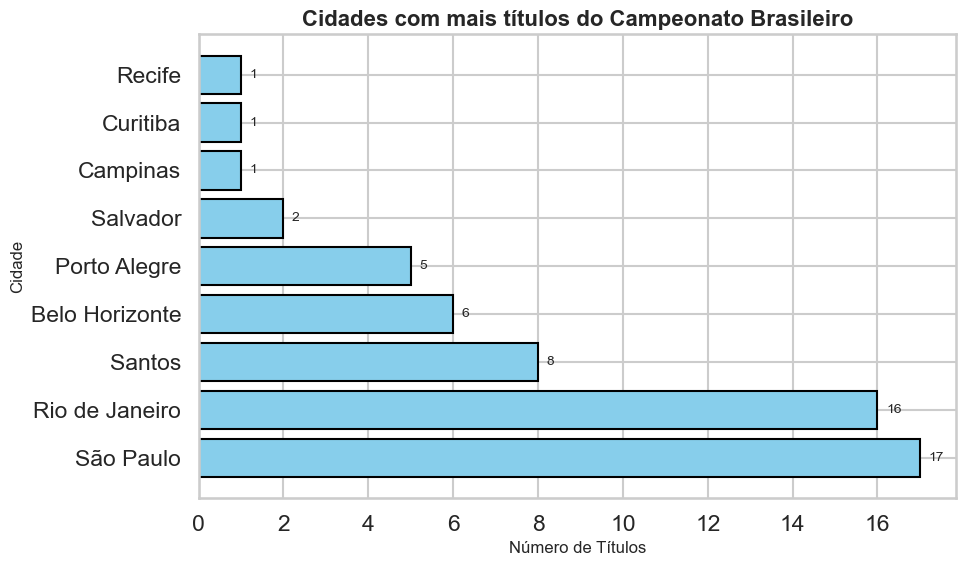

In [136]:
# Utilizando o MatplotLib para criar um gráfico visual

plt.figure(figsize=(10, 6))
plt.barh(titulos_por_cidade['Cidade'], titulos_por_cidade['Títulos'], color='skyblue', edgecolor='black')
plt.title('Cidades com mais títulos do Campeonato Brasileiro', fontsize=16, weight='bold')
plt.xlabel('Número de Títulos', fontsize=12)
plt.ylabel('Cidade', fontsize=12)

# Mostrar valores nas barras
for i, v in enumerate(titulos_por_cidade['Títulos']):
    plt.text(v + 0.2, i, str(v), va='center', fontsize=10)

plt.tight_layout()
plt.show()

# As 3 primeiras cidades mais vitoriosas refletem o domínio da região Sudeste no campeonato nacional


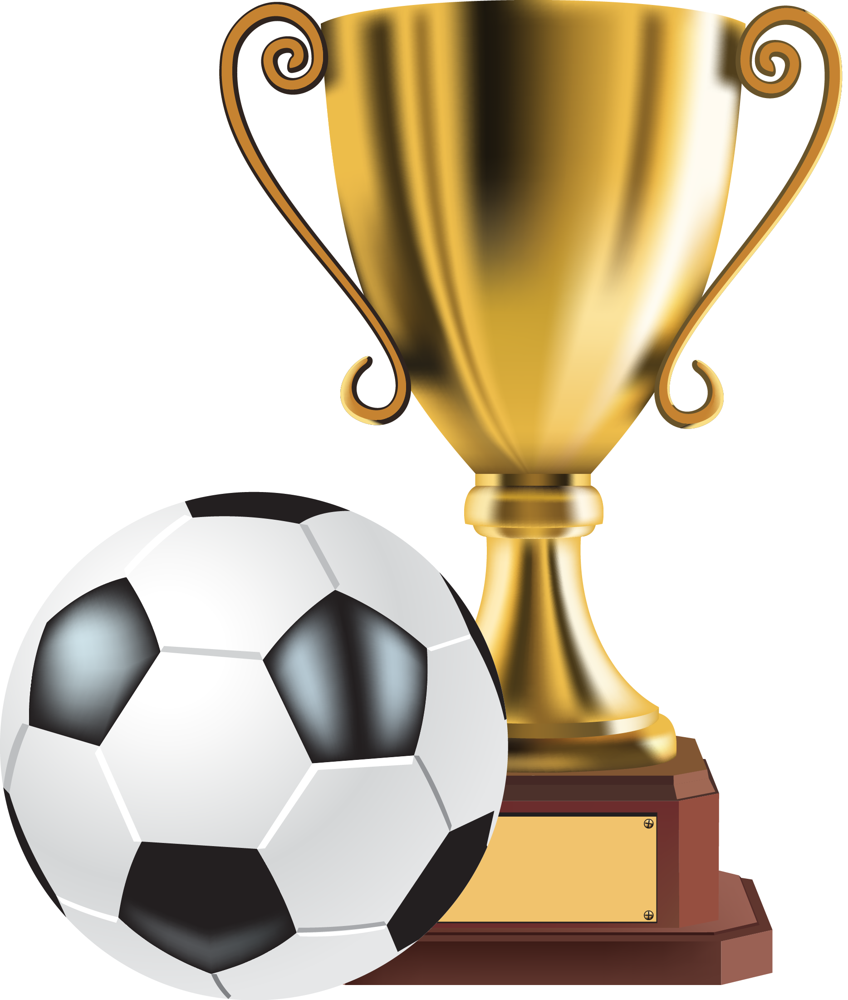
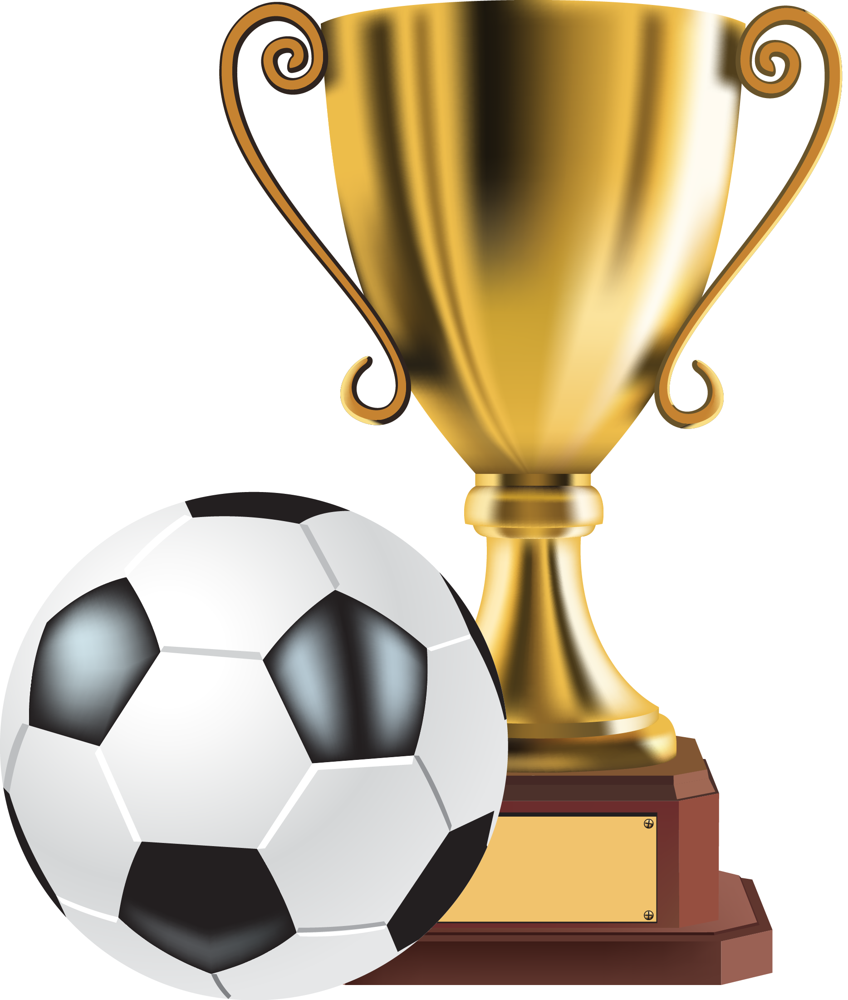
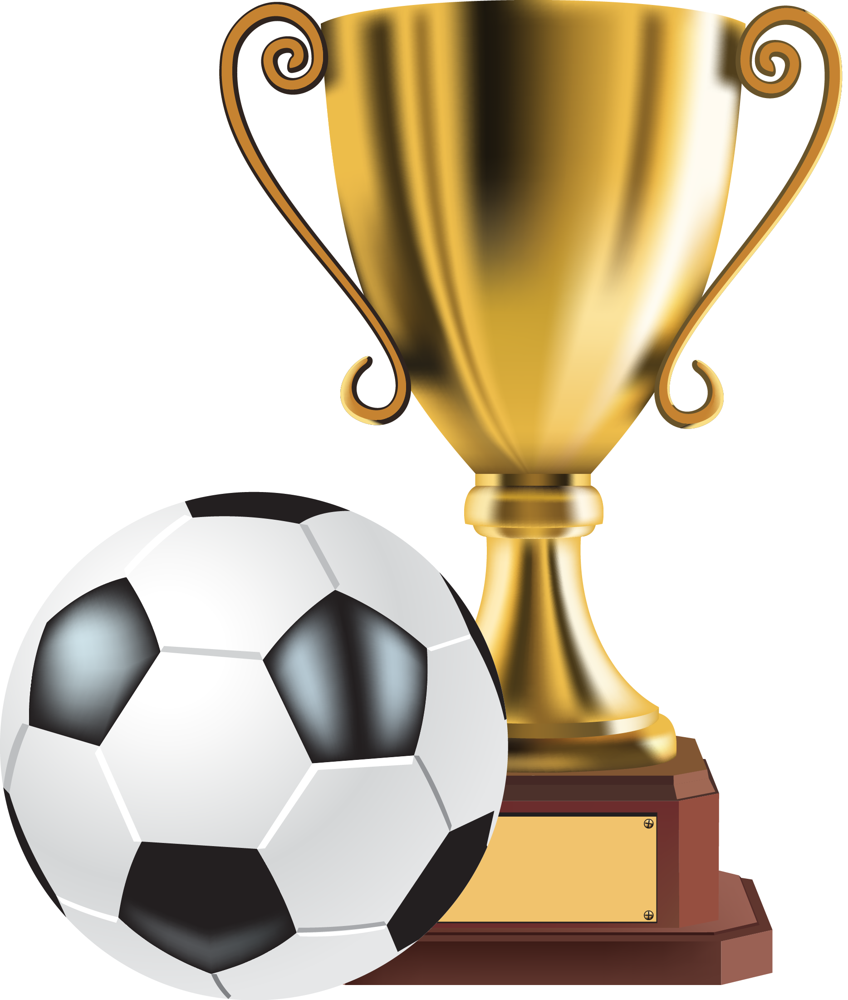
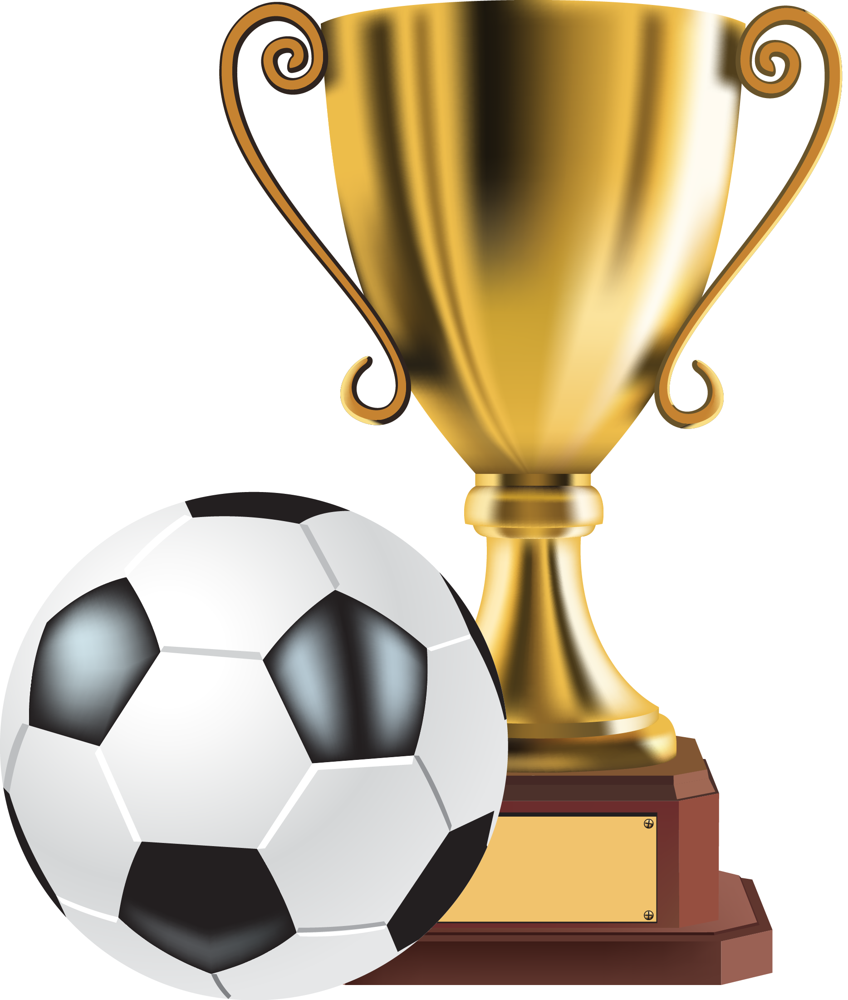
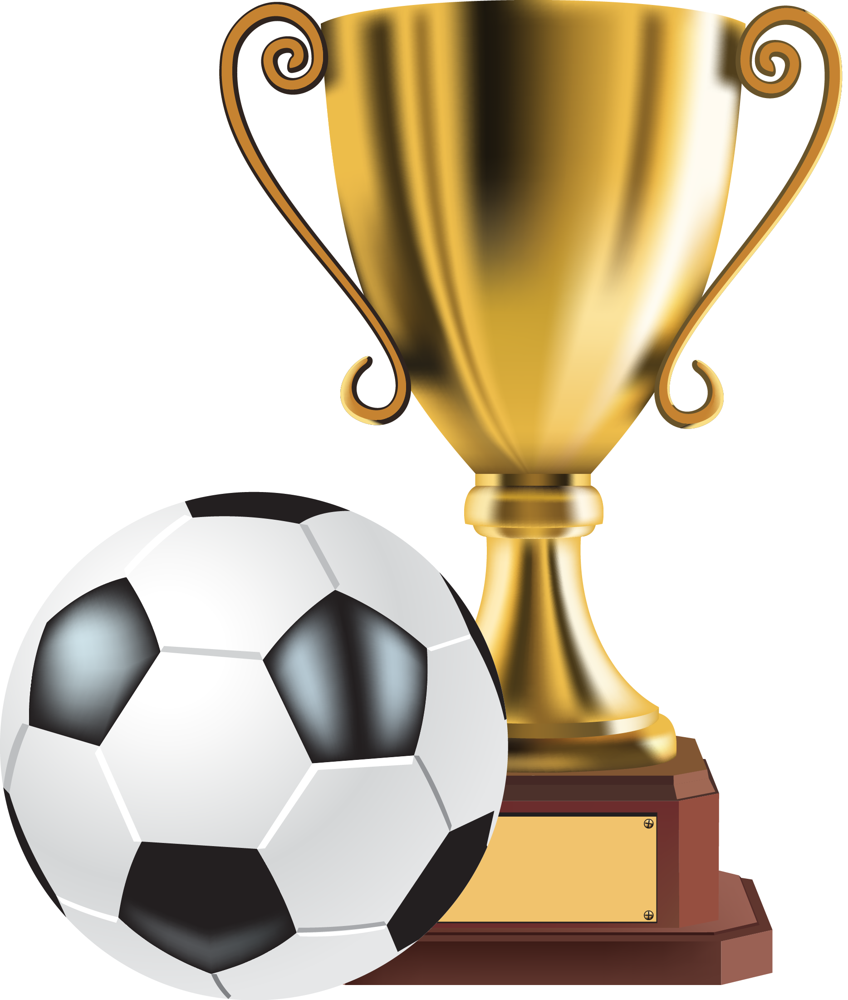
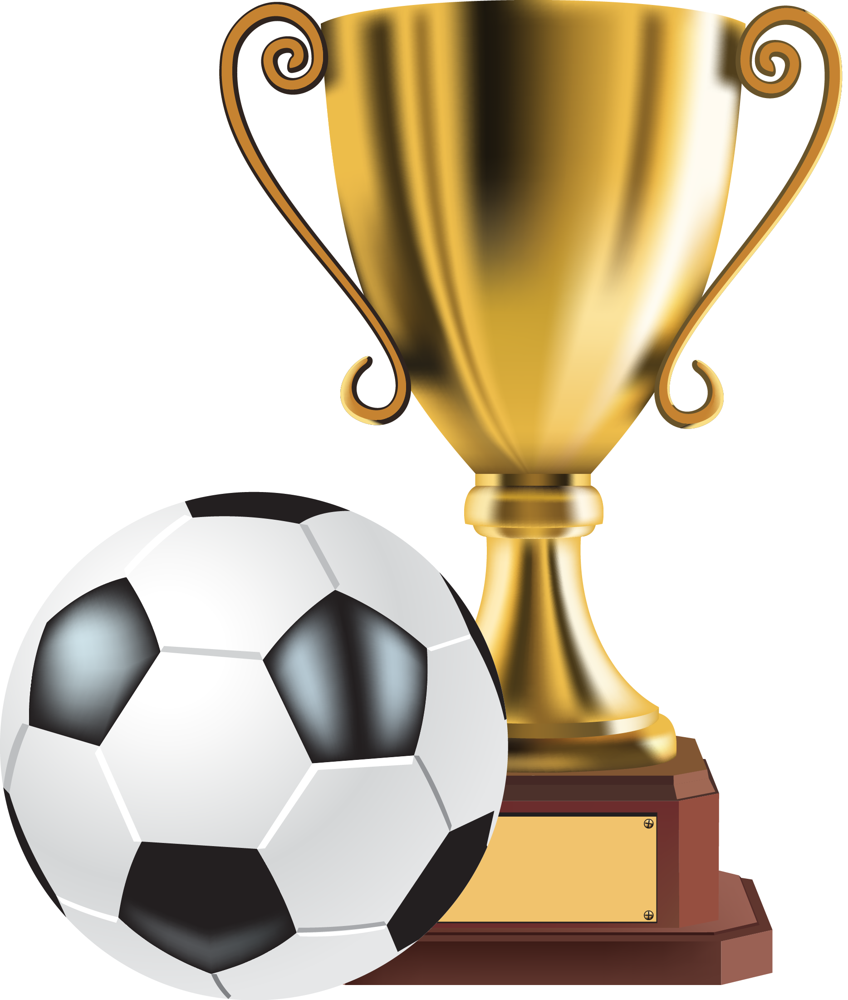
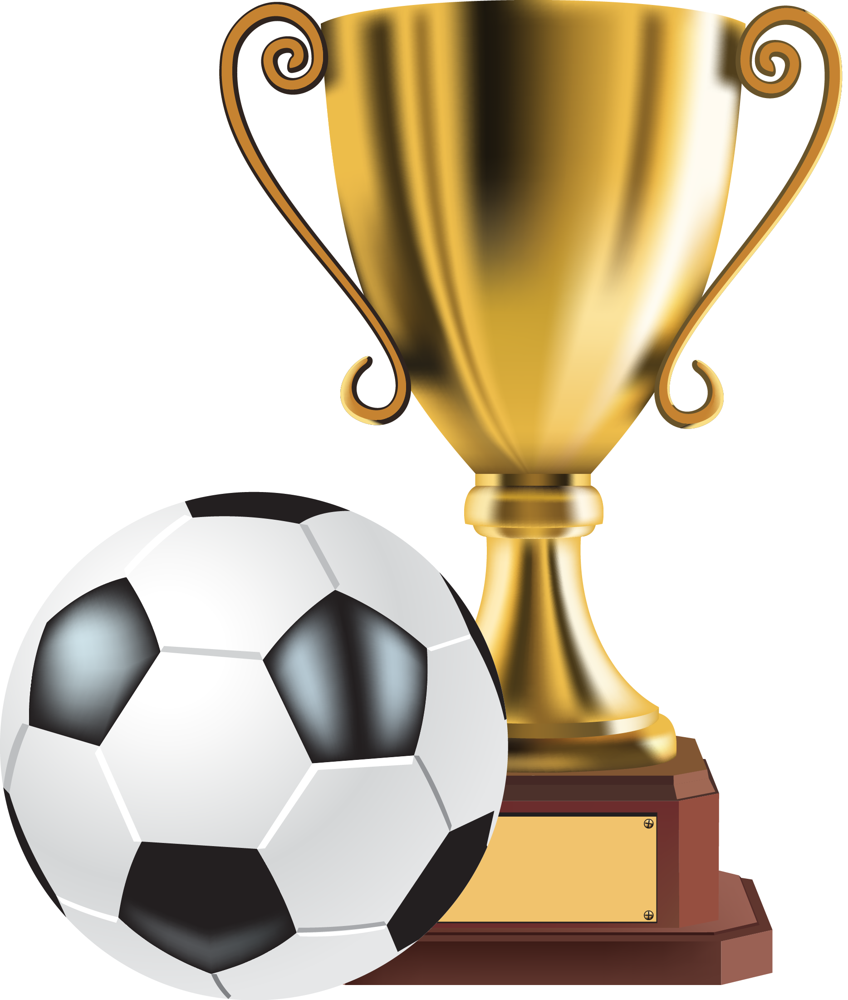
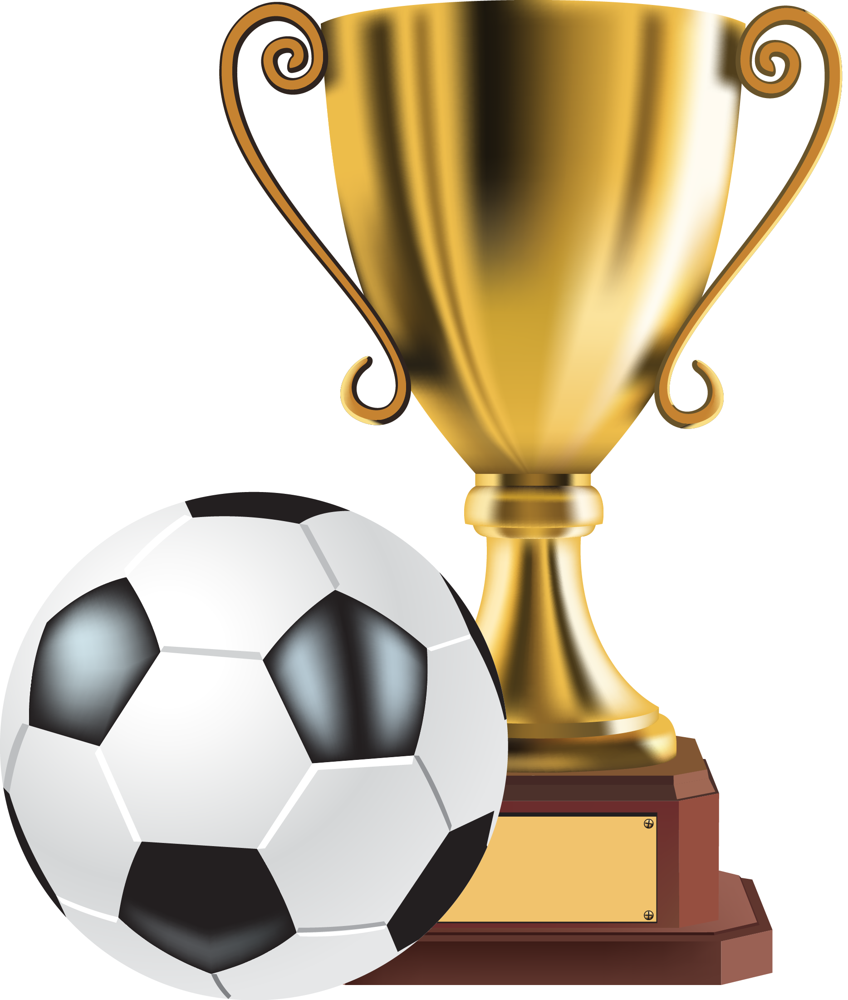
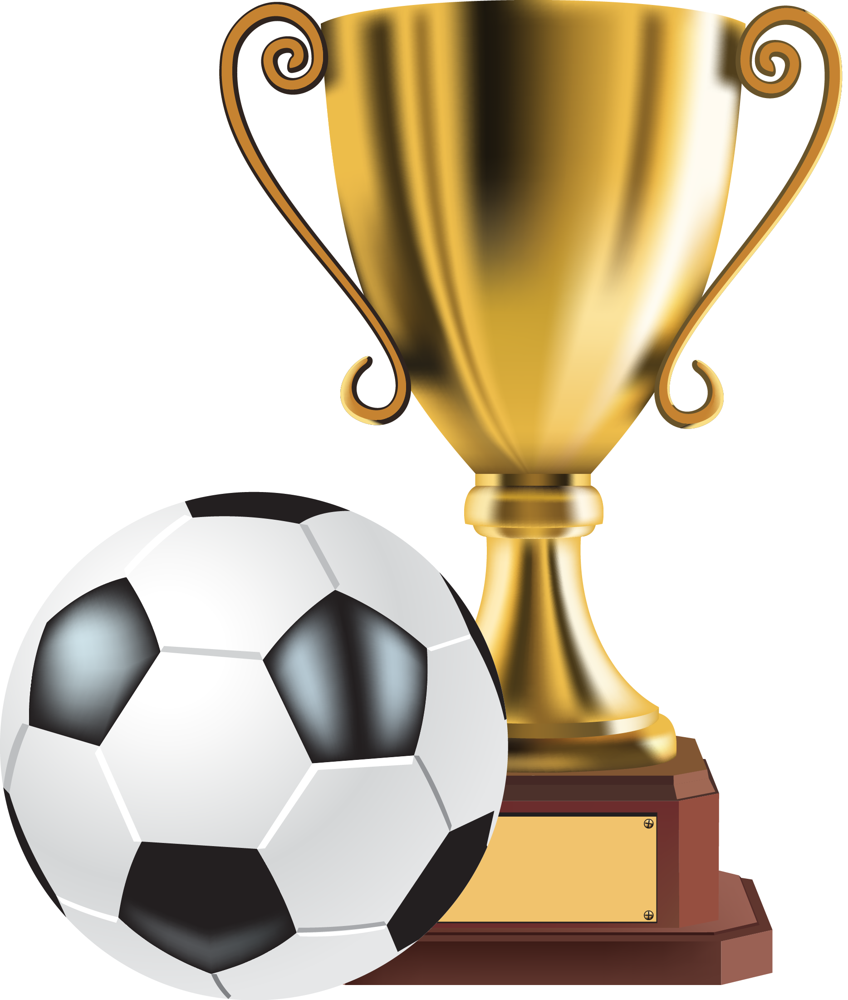

In [145]:
# Utilizando um mapa interativo do Folium para destacar a área campeão do Brasil

import folium

import folium

# Coordenadas aproximadas das cidades campeãs
coordenadas = {
    'São Paulo': [-23.5505, -46.6333],
    'Rio de Janeiro': [-22.9068, -43.1729],
    'Santos': [-23.9608, -46.3336],
    'Belo Horizonte': [-19.9167, -43.9345],
    'Porto Alegre': [-30.0331, -51.23],
    'Salvador': [-12.9777, -38.5016],
    'Campinas': [-22.9056, -47.0608],
    'Curitiba': [-25.4284, -49.2733],
    'Recife': [-8.0476, -34.8770]
}

# Criar mapa centralizado no Brasil
mapa = folium.Map(location=[-14.235, -51.9253], zoom_start=4)

# Adicionando marcadores com troféu proporcional
for i, row in titulos_por_cidade.iterrows():
    cidade = row['Cidade']
    titulos = row['Títulos']
    lat, lon = coordenadas[cidade]
    
    # Singular/plural no popup
    popup_text = f"{cidade}: {titulos} título" if titulos == 1 else f"{cidade}: {titulos} títulos"
    
    # Tamanho do ícone proporcional
    icon_size = 20 + titulos*2
    
    icon = folium.CustomIcon(
        icon_image='trophy2.png',  # usar o novo PNG
        icon_size=(icon_size, icon_size)
    )
    
    folium.Marker(
        location=[lat, lon],
        popup=popup_text,
        icon=icon
    ).add_to(mapa)

mapa


# Percebmos um domínio da Região Sudeste nos títulos nacionais
